# 1. Getting Started: Airbnb Copenhagen

This assignment deals with the most recent Airbnb listings in Copenhagen. The data is collected from [Inside Airbnb](http://insideairbnb.com/copenhagen). Feel free to explore the website further in order to better understand the data. The data (*listings.csv*) has been collected as raw data and needs to be preprocessed.

**Hand-in:** Hand in as a group in Itslearning in a **single**, well-organized and easy-to-read Jupyter Notebook. Please just use this notebook to complete the assignment.

If your group consists of students from different classes, upload in **both** classes.

The first cell does some preprocessing. Please just run these cells and do not change anything. The assignment starts below. Make sure that listings.csv' is in the same folder as this notebook




<>:55: SyntaxWarning: invalid escape sequence '\$'
<>:55: SyntaxWarning: invalid escape sequence '\$'
/tmp/ipykernel_2925/3921878554.py:55: SyntaxWarning: invalid escape sequence '\$'
  data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)


,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365,price_category
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,898.0,3,...,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,2600.0,4,...,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303,1
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,3250.0,3,...,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56,1
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725.0,7,...,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59,0
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954.0,3,...,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0,1


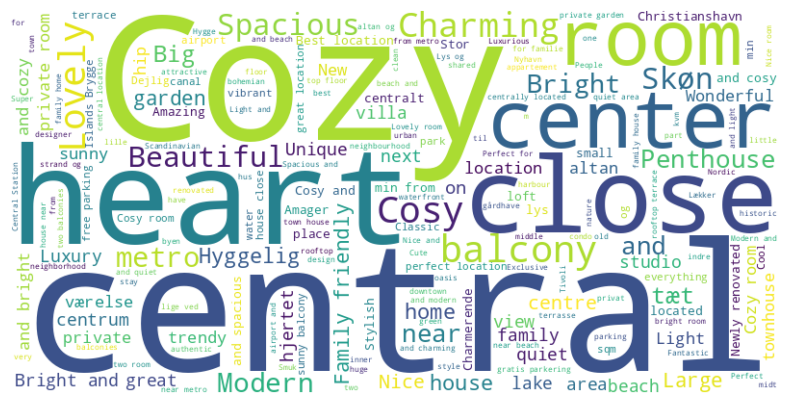

In [1]:
# pip install pandas
# pip install scikit-learn
import pandas as pd
import sklearn as sk

# load the data
data = pd.read_csv('listings.csv')

# filter relevant columns
data_limited = data[["id",
    "name",
    "host_id"  ,
    "host_name" , 
    "neighbourhood_cleansed"  ,
    "latitude"  ,
    "longitude"  ,
    "room_type"  ,
    "price"  ,
    "minimum_nights"  ,
    "number_of_reviews",  
    "last_review"  ,
    "review_scores_rating"  ,
    "review_scores_accuracy" , 
    "review_scores_cleanliness"  ,
    "review_scores_checkin"  ,
    "review_scores_communication"  ,
    "review_scores_location"  ,
    "review_scores_value"  ,
    "reviews_per_month"  ,
    "calculated_host_listings_count"  ,
    "availability_365",]]

# removing rows with no reviews

data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]

# remove nan

data_filtered = data_filtered.dropna()
data_filtered.head()

# get a list of distinct values from neighbourhood_cleansed columns in data_filtered

neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# replace e.g. Nrrbro with Nørrebro in neighbourhood_cleansed column

data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Nrrebro", "Nørrebro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("sterbro", "Østerbro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Vanlse", "Vanløse")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Brnshj-Husum", "Brønshøj-Husum")
neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# Remove dollar signs and commas and convert to float - note the prices are actually in DKK
data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)

# Calculate the median price
median_price = data_filtered['price'].median()

# Create a new column 'price_category' with 0 for 'affordable' and 1 for 'expensive'
data_filtered['price_category'] = (data_filtered['price'] > median_price).astype(int)

display(data_filtered.head())

# Describe the apartments using a wordcloud
# Remember to install packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine the two lists of stop words
stop_words = ['Østerbro', 'Copenhagen', 'København', 'in', 'bedroom', 'bedrooms', 'bed', 'beds', 'bath', 'baths', 'Frederiksberg', 'V', 'Ø', 'SV', 'S', 'N', 'K', 'C', 'W', 'kbh', 'Ballerup', 'Hellerup', 'Valby', 'Vanløse', 'Brønhøj', 'Nørrebro', 'Vesterbro', "CPH", "with", "to", "of", "a", "the", "på", "i", "med", "af", "at", "city", "by", "apartment", "appartment", "lejlighed", "flat", "m2", "apt"]

# Convert the 'name' column to a single string
text = ' '.join(data_filtered['name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)
print(wordcloud)
# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Your tasks start here


### 1. Since data science is so much fun, provide a word cloud of the names of the hosts, removing any names of non-persons. Does this more or less correspond with the distribution of names according to [Danmarks Statistik](https://www.dst.dk/da/Statistik/emner/borgere/navne/navne-i-hele-befolkningen)?

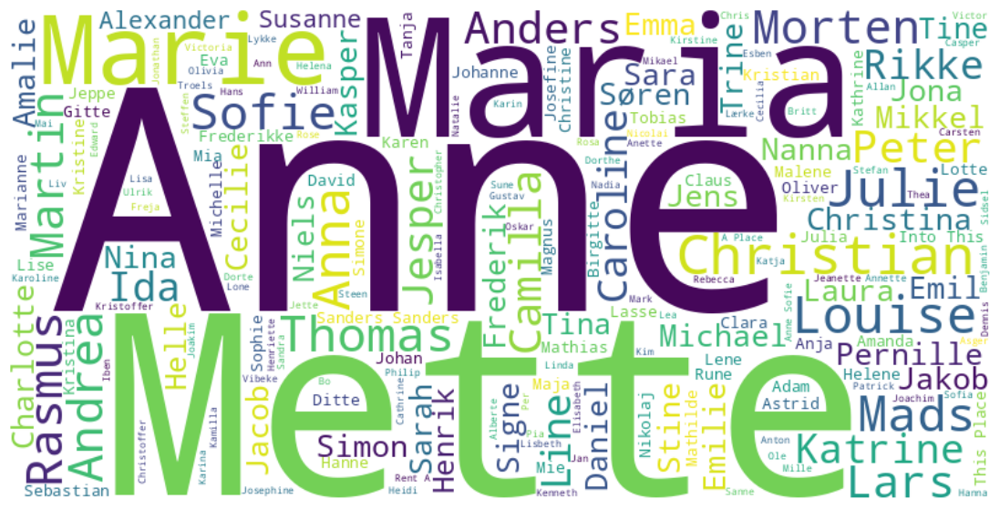

In [2]:
stop_host_words = ["&", "Og", "+", "And"]
host_names_cleaned = data_filtered.loc[~data_filtered['host_name'].isin(['ApartmentinCopenhagen','This Place','That Place','A Place','A Rent', 'Rent', 'Forenom Denmark']), 'host_name']

host_text = " ".join(host_names_cleaned)
wordcloud = WordCloud(stopwords=stop_host_words, background_color='white', width=800, height=400).generate(host_text)
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### 2. Using non-scaled versions of latitude and longitude, plot the listings data on a map.

In [3]:
# State your solution here. Add more cells if needed.
import folium
from folium.plugins import MarkerCluster

data_filtered['latitude'] = data_filtered['latitude'].round(5)
data_filtered['longitude'] = data_filtered['longitude'].round(5)

map_center = [data_filtered['latitude'].mean(), data_filtered['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=12)

marker_cluster = MarkerCluster().add_to(m)

# Add markers for each listing to the MarkerCluster
for idx, row in data_filtered.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=row['host_name']).add_to(marker_cluster)

m

### 3. Create boxplots where you have the neighbourhood on the x-axis and price on the y-axis. What does this tell you about the listings in Copenhagen? Keep the x-axis as is and move different variables into the y-axis to see how things are distributed between the neighborhoods to create different plots (your choice).

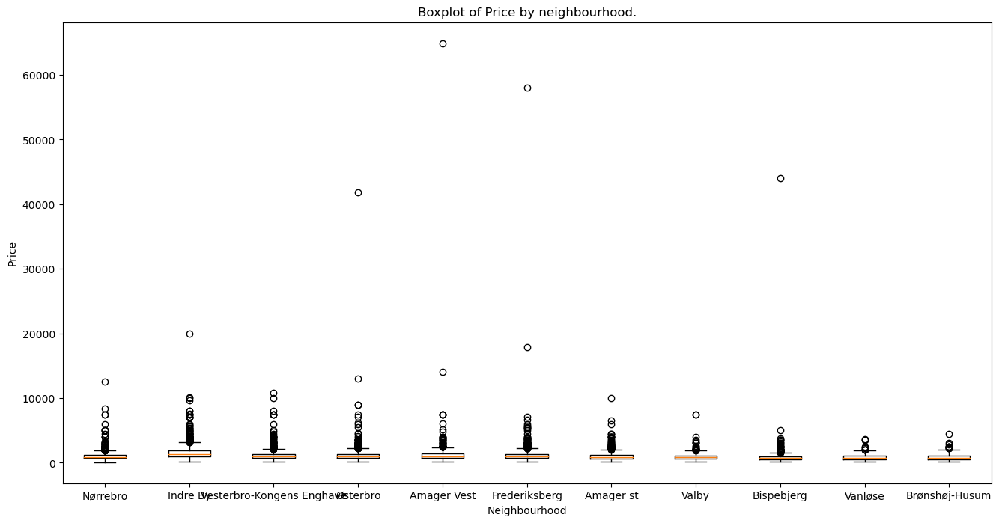

In [4]:
# State your solution here. Add more cells if needed.
import matplotlib.pyplot as plt

neighbourhoods = data_filtered["neighbourhood_cleansed"].unique().tolist()

plt.figure(figsize=(16,8))

plt.boxplot([data_filtered[data_filtered['neighbourhood_cleansed']== neighbourhood]['price'] for neighbourhood in neighbourhoods], labels=neighbourhoods)

plt.xlabel('Neighbourhood')
plt.ylabel('Price')
plt.title('Boxplot of Price by neighbourhood.')
plt.show()

### 4. Do a descriptive analysis of the neighborhoods. Include information about room type in the analysis as well as one other self-chosen feature. The descriptive analysis should contain mean/average, mode, median, standard deviation/variance, minimum, maximum and quartiles.

In [5]:

columns_to_describe = [
    'price',
    'minimum_nights',
    'number_of_reviews',
    'review_scores_rating',
    'room_type',
]
pd.set_option("display.max_columns",None)
nb1 = data_filtered.groupby('neighbourhood_cleansed')[columns_to_describe].describe(include=['object','float','int'])
display(nb1.stack().head(60))
display(nb1.head(60))
nb2 = nb1.stack()



price  minimum_nights  \
neighbourhood_cleansed                                        
Amager Vest            count    1059.000000     1059.000000   
                       unique           NaN             NaN   
                       top              NaN             NaN   
                       freq             NaN             NaN   
                       mean     1205.754485        3.803588   
                       std      2121.656424        8.562853   
                       min       200.000000        1.000000   
                       25%       722.000000        2.000000   
                       50%      1000.000000        3.000000   
                       75%      1400.000000        4.000000   
                       max     64900.000000      180.000000   
Amager st              count     924.000000      924.000000   
                       unique           NaN             NaN   
                       top              NaN             NaN   
                       freq             NaN             NaN   
                       mean     1019.860390        4.240260   
                       std       704.769611        7.863038   
                       min       135.000000        1.000000   
                       25%       650.000000        2.000000   
                       50%       851.000000        3.000000   
                       75%      1190.000000        4.000000   
                       max     10000.000000       90.000000   
Bispebjerg             count     604.000000      604.000000   
                       unique           NaN             NaN   
                       top              NaN             NaN   
                       freq             NaN             NaN   
                       mean      912.066225        4.562914   
                       std      1831.810612       20.536123   
                       min       143.000000        1.000000   
                       25%       542.250000        2.000000   
                       50%       747.500000        3.000000   
                       75%       961.000000        4.000000   
                       max     44000.000000      500.000000   
Brønshøj-Husum         count     285.000000      285.000000   
                       unique           NaN             NaN   
                       top              NaN             NaN   
                       freq             NaN             NaN   
                       mean      875.487719        4.456140   
                       std       552.009744        5.777781   
                       min       145.000000        1.000000   
                       25%       500.000000        2.000000   
                       50%       750.000000        3.000000   
                       75%      1100.000000        5.000000   
                       max      4462.000000       60.000000   
Frederiksberg          count    1177.000000     1177.000000   
                       unique           NaN             NaN   
                       top              NaN             NaN   
                       freq             NaN             NaN   
                       mean     1216.676296        4.441801   
                       std      1866.619993       13.595788   
                       min       185.000000        1.000000   
                       25%       750.000000        2.000000   
                       50%      1000.000000        3.000000   
                       75%      1339.000000        4.000000   
                       max     58000.000000      365.000000   
Indre By               count    1844.000000     1844.000000   
                       unique           NaN             NaN   
                       top              NaN             NaN   
                       freq             NaN             NaN   
                       mean     1570.907267        4.412690   

                               number_of_reviews  review_scores_rating  \
neighbourhood_cleansed                                   

price                                            \
                            count unique top freq         mean          std   
neighbourhood_cleansed                                                        
Amager Vest                1059.0    NaN NaN  NaN  1205.754485  2121.656424   
Amager st                   924.0    NaN NaN  NaN  1019.860390   704.769611   
Bispebjerg                  604.0    NaN NaN  NaN   912.066225  1831.810612   
Brønshøj-Husum              285.0    NaN NaN  NaN   875.487719   552.009744   
Frederiksberg              1177.0    NaN NaN  NaN  1216.676296  1866.619993   
Indre By                   1844.0    NaN NaN  NaN  1570.907267  1065.975980   
Nørrebro                   2057.0    NaN NaN  NaN  1014.792902   609.390458   
Valby                       539.0    NaN NaN  NaN   932.137291   622.836251   
Vanløse                     298.0    NaN NaN  NaN   874.543624   502.561017   
Vesterbro-Kongens Enghave  2034.0    NaN NaN  NaN  1114.638643   692.600286   
Østerbro                   1305.0    NaN NaN  NaN  1183.891188  1385.237978   

                                                                    \
                             min     25%     50%      75%      max   
neighbourhood_cleansed                                               
Amager Vest                200.0  722.00  1000.0  1400.00  64900.0   
Amager st                  135.0  650.00   851.0  1190.00  10000.0   
Bispebjerg                 143.0  542.25   747.5   961.00  44000.0   
Brønshøj-Husum             145.0  500.00   750.0  1100.00   4462.0   
Frederiksberg              185.0  750.00  1000.0  1339.00  58000.0   
Indre By                   165.0  995.00  1350.0  1870.50  20000.0   
Nørrebro                    79.0  720.00   900.0  1199.00  12500.0   
Valby                      127.0  600.00   800.0  1119.50   7429.0   
Vanløse                    200.0  536.75   750.5  1091.75   3643.0   
Vesterbro-Kongens Enghave  186.0  760.25   999.0  1299.00  10800.0   
Østerbro                   200.0  750.00   979.0  1331.00  41800.0   

                          minimum_nights                                       \
                                   count unique top freq      mean        std   
neighbourhood_cleansed                                                          
Amager Vest                       1059.0    NaN NaN  NaN  3.803588   8.562853   
Amager st                          924.0    NaN NaN  NaN  4.240260   7.863038   
Bispebjerg                         604.0    NaN NaN  NaN  4.562914  20.536123   
Brønshøj-Husum                     285.0    NaN NaN  NaN  4.456140   5.777781   
Frederiksberg                     1177.0    NaN NaN  NaN  4.441801  13.595788   
Indre By                          1844.0    NaN NaN  NaN  4.412690  14.861322   
Nørrebro                          2057.0    NaN NaN  NaN  4.736509  28.390937   
Valby                              539.0    NaN NaN  NaN  3.853432   9.903758   
Vanløse                            298.0    NaN NaN  NaN  4.026846   4.841524   
Vesterbro-Kongens Enghave         2034.0    NaN NaN  NaN  4.317601  15.393460   
Østerbro                          1305.0    NaN NaN  NaN  4.390805  11.249086   

                                                      number_of_reviews  \
                           min  25%  50%  75%     max             count   
neighbourhood_cleansed                                                    
Amager Vest                1.0  2.0  3.0  4.0   180.0            1059.0   
Amager st                  1.0  2.0  3.0  4.0    90.0             924.0   
Bispebjerg                 1.0  2.0  3.0  4.0   500.0             604.0   
Brønshøj-Husum             1.0  2.0  3.0  5.0    60.0             285.0   
Frederiksberg              1.0  2.0  3.0  4.0   365.0            1177.0   
Indre By                   1.0  2.0  3.0  4.0   400.0            1844.0   
Nørrebro                   1.0  2.0  3.0  4.0  1111.0            2057.0   
Valby                      1.0  2.0  3.0  4.0   200.0  

### 5. Based on self-chosen features, and with "price_category" as your target, develop a k-Nearest Neighbor model to determine whether a rental property should be classified as 0 or 1. Remember to divide your data into training data and test data. Comment on your findings.

In [6]:
# State your solution here. Add more cells if needed.
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import OneHotEncoder

columns_to_drop = [
    "id",
    "name",
    'host_id',
    'host_name',
    'latitude',
    'longitude',
    'price',
    'last_review',
    'price_category',
]

number_outliers_columns = [
    'minimum_nights',
    'number_of_reviews',
    'review_scores_rating',
    'review_scores_accuracy',
    'review_scores_cleanliness',
    'review_scores_checkin',
    'review_scores_communication',
    'review_scores_location',
    'review_scores_value',
    'reviews_per_month',
    'calculated_host_listings_count',
    'availability_365',
]
 
# X = pd.get_dummies(data_filtered.drop(columns=columns_to_drop), drop_first=True)
X = data_filtered.drop(columns=columns_to_drop)

# get only numerical columns from X
# X = X.select_dtypes(include='number')
# X['room_type'] = X['room_type'].eq('Private room').mul(1)
X = pd.get_dummies(X, drop_first=True)



y = data_filtered['price_category']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)


Accuracy for euclidean and 1 neighbors: 0.5708985985160758
Accuracy for euclidean and 3 neighbors: 0.5816158285243199
Accuracy for euclidean and 9 neighbors: 0.5836768342951361
Accuracy for euclidean and 11 neighbors: 0.5869744435284419
Accuracy for euclidean and 14 neighbors: 0.5919208573784006
Accuracy for euclidean and 15 neighbors: 0.6001648804616653
Accuracy for euclidean and 16 neighbors: 0.6026380873866447
Accuracy for euclidean and 17 neighbors: 0.6079967023907666
Accuracy for manhattan and 11 neighbors: 0.6104699093157461
Accuracy for manhattan and 13 neighbors: 0.613767518549052
Accuracy for manhattan and 15 neighbors: 0.6191261335531739
Accuracy for manhattan and 17 neighbors: 0.6224237427864798
Accuracy for manhattan and 19 neighbors: 0.6319043693322342


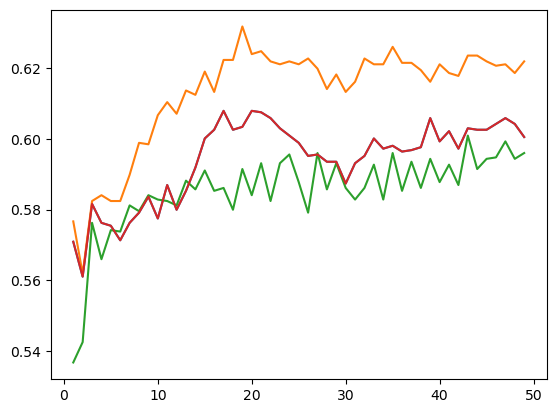

In [7]:
for column in number_outliers_columns:
    qd = X_train[column].quantile(0.01)
    qu = X_train[column].quantile(0.99)

    X_train[column] = X_train[column].clip(qd,qu)
    X_test[column] = X_test[column].clip(qd,qu)



metrics = ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
n_neighbors = range(1, 50)

acc_max = 0.0

for metric in metrics:

    acc = []
    for n in n_neighbors:
        model = KNeighborsClassifier(n_neighbors=n, metric=metric)
        model = model.fit(X=X_train, y=y_train)

        y_pred = model.predict(X_test)
        acc_score = (y_test==y_pred).mean()

        if acc_score > acc_max:
            acc_max = acc_score
            print(f"Accuracy for {metric} and {n} neighbors: {acc_score}")


        acc.append(acc_score)

    plt.plot(n_neighbors, acc, label=metric)

